<a href="https://colab.research.google.com/github/DerrickKuria/Phoenix-Project/blob/main/Cableprime.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



# **1. Business Understanding**



###**Description**


---



You are working for Cable Prime as a Senior Manager for Analytics & Insights. One of the sales consultants has brought you the attached dataset to provide him with an informative analysis and actionable insights.


He/She intends to use your analysis to present to the Head of Sales in a 15-minute presentation.

Required

*  Give the process you have followed to prepare this data for an informative analysis.

*  Provide an overview or descriptive analytics of this data, and add diagnostic analysis (why is the picture like that). State the assumptions you have made.

*  Create a sales forecast for the coming year. State any assumptions made.

*  What factors affect sales growth in this business? Provide recommendations to the business on how they can get to 150% of their current sales performance next year.


*  The sales consultant requests that you provide him with this analysis every month-end going forward. Outline your plan and execution of this request to facilitate for an efficient way that uses minimal resources each month-end. State the ideal or possible tools and/or technologies you would use.




###**Data Understanding**


---

The dataset has 9 variables:
PaymentAmount, PaymentDate, CustomerIdentifier, PaymentMethod, Gender, Race, Province, ProductID, Age.  

The PaymentDate spuns from

***02-January-19 to 18-August-19***


# **2. Analysis**

---



###**a.Load Libraries and Data**

In [10]:
import os
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline

from datetime import datetime
import numpy as np
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')


import plotly.express as px
import plotly.graph_objs as go

In [11]:

file_name = '/content/Cable Prime Data Data Set.xlsx'
df = pd.read_excel(file_name)


###**b.EDA**


###i.Data Inpection




In [12]:
# print the first 5 rows
df.head()


,PaymentAmount,PaymentDate,CustomerIdentifier,PaymentMethod,Gender,Race,Province,ProductID,Age
0,$107,20190623,81246587.0,Debit Order,Female,Black,North West,269424.0,32
1,$53,20190623,82087789.0,Debit Order,Female,Black,Gauteng,685715.0,48
2,$171,20190623,115560640.0,Debit Order,Male,White,Gauteng,523463.0,64
3,$42,20190623,87506111.0,Debit Order,Female,Asian,Free State,420110.0,27
4,$53,20190623,114356637.0,Debit Order,Female,NaN,Gauteng,761379.0,35


In [13]:
 # print the last 5 rows just ro check for the data consistency
df.tail()

,PaymentAmount,PaymentDate,CustomerIdentifier,PaymentMethod,Gender,Race,Province,ProductID,Age
584003,$192,20190623,78176363.0,Debit Order,Female,Coloured,N/E/W Cape,420110.0,59
584004,$53,20190623,114215516.0,Debit Order,Female,White,Gauteng,32384.0,41
584005,$213,20190623,114228474.0,Cash,Female,White,Gauteng,32384.0,44
584006,$85,20190623,115593555.0,Debit Order,Male,Black,Gauteng,523463.0,55
584007,$171,20190623,115639569.0,Debit Order,Female,White,Gauteng,523463.0,33


In [14]:
# Check the size of the dataframe.
df.shape

(584008, 9)

In [15]:
#check for the range
df.index

RangeIndex(start=0, stop=584008, step=1)

In [16]:
# The datasets colu8mns as named in the Data Understanding
df.columns

Index(['PaymentAmount ', 'PaymentDate', 'CustomerIdentifier', 'PaymentMethod',
       'Gender', 'Race', 'Province', 'ProductID', 'Age'],
      dtype='object')

In [17]:
df.dtypes

PaymentAmount          object
PaymentDate             int64
CustomerIdentifier    float64
PaymentMethod          object
Gender                 object
Race                   object
Province               object
ProductID             float64
Age                     int64
dtype: object

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 584008 entries, 0 to 584007
Data columns (total 9 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   PaymentAmount       584008 non-null  object 
 1   PaymentDate         584008 non-null  int64  
 2   CustomerIdentifier  584007 non-null  float64
 3   PaymentMethod       582789 non-null  object 
 4   Gender              583957 non-null  object 
 5   Race                583223 non-null  object 
 6   Province            583987 non-null  object 
 7   ProductID           584007 non-null  float64
 8   Age                 584008 non-null  int64  
dtypes: float64(2), int64(2), object(5)
memory usage: 40.1+ MB


In [19]:
categorical = ['object']

category = df.select_dtypes(include=categorical)
category.columns

Index(['PaymentAmount ', 'PaymentMethod', 'Gender', 'Race', 'Province'], dtype='object')

We will check the consistency of our categorical columns.
We also see Payment amount has been wrongly categorized as variable character instead of integer.


We will change that in cleaning

In [20]:
print(df.Gender.unique())
print(df.Gender.nunique())

['Female' 'Male' nan]
2


In [21]:
print(df.Race.unique())
print(df.Race.nunique())

['Black' 'White' 'Asian' nan 'Coloured' 'Indian']
5


In [22]:
print(df.Province.unique())
print(df.Province.nunique())

['North West' 'Gauteng' 'Free State' 'N/E/W Cape' 'Kwazulu Natal'
 'Mpumalanga' 'Limpopo' nan]
7


In [23]:
print(df.PaymentMethod.unique())
print(df.PaymentMethod.nunique())

['Debit Order' 'Cash' 'EFT' 'In Store' nan 'Mobile App' 'USSD']
6


In [24]:
df.describe().apply(lambda s: s.apply('{0:.5f}'.format))
# df.describe().apply(lambda s: s.apply(lambda x: format(x, 'g'))) works as well.

,PaymentDate,CustomerIdentifier,ProductID,Age
count,584008.00000,584007.00000,584007.00000,584008.00000
mean,20190411.69073,99169917.98017,406154.10644,40.89267
std,193.81064,14804591.43230,241437.40466,12.95716
min,20190102.00000,-9.00000,32384.00000,1.00000
25%,20190225.00000,84122732.00000,269424.00000,30.00000
50%,20190413.00000,104228569.00000,523463.00000,41.00000
75%,20190604.00000,114436868.00000,523463.00000,48.00000
max,20190818.00000,115656267.00000,844702.00000,200.00000


We see one of the client has an age of 200. We will get the distribution of years just to inspect if there is dirty data here


###ii.Data Cleaning

First let us change the data types.

In [25]:
df.columns

Index(['PaymentAmount ', 'PaymentDate', 'CustomerIdentifier', 'PaymentMethod',
       'Gender', 'Race', 'Province', 'ProductID', 'Age'],
      dtype='object')

In [26]:

def convert_to_numeric(x):
  try:
    return float(x.replace('$', ''))
  except:
    return pd.NA

df['PaymentAmount '] = df['PaymentAmount '].apply(convert_to_numeric)

In [27]:
df.dtypes

PaymentAmount          object
PaymentDate             int64
CustomerIdentifier    float64
PaymentMethod          object
Gender                 object
Race                   object
Province               object
ProductID             float64
Age                     int64
dtype: object

In [28]:
df.head(1)

,PaymentAmount,PaymentDate,CustomerIdentifier,PaymentMethod,Gender,Race,Province,ProductID,Age
0,107.0,20190623,81246587.0,Debit Order,Female,Black,North West,269424.0,32


In [29]:
df['PaymentAmount '] = pd.to_numeric(df['PaymentAmount '], errors='coerce')

In [30]:
#df['CustomerIdentifier'] = df['CustomerIdentifier'].astype(str)

In [31]:
#df['ProductID'] = df['ProductID'].astype(str)

In [32]:
df.dtypes

PaymentAmount         float64
PaymentDate             int64
CustomerIdentifier    float64
PaymentMethod          object
Gender                 object
Race                   object
Province               object
ProductID             float64
Age                     int64
dtype: object

The data types are all now all aligned

We will look into the null values.

In [33]:
df.isna().sum()

PaymentAmount         1108
PaymentDate              0
CustomerIdentifier       1
PaymentMethod         1219
Gender                  51
Race                   785
Province                21
ProductID                1
Age                      0
dtype: int64

Payment method has the most null values. We will do a percentage to check significance of the null before we decide the steps to take.

Methods that we can fill in null values include


*   Removing Null Values
*   Imputation Techniques
*   Interpolation

In [34]:
(df.isnull().sum()/(len(df)))*100

PaymentAmount         0.189723
PaymentDate           0.000000
CustomerIdentifier    0.000171
PaymentMethod         0.208730
Gender                0.008733
Race                  0.134416
Province              0.003596
ProductID             0.000171
Age                   0.000000
dtype: float64

As witnessed, there is barely a column that is beyondd 1 % of the null values. This means we can assume the blanks and work with them as they are.



> This is one of our assumptions in the project



In [35]:
# Check for Duplicates
df.duplicated().sum()

0

In [36]:
#check for duplication for each column
df.nunique()

PaymentAmount            826
PaymentDate              229
CustomerIdentifier    142939
PaymentMethod              6
Gender                     2
Race                       5
Province                   7
ProductID                  9
Age                       61
dtype: int64

In [37]:

df['PaymentDate'] = pd.to_datetime(df['PaymentDate'], format='%Y%m%d')

In [38]:
df.dtypes


PaymentAmount                float64
PaymentDate           datetime64[ns]
CustomerIdentifier           float64
PaymentMethod                 object
Gender                        object
Race                          object
Province                      object
ProductID                    float64
Age                            int64
dtype: object

In [39]:
df.head(10)

,PaymentAmount,PaymentDate,CustomerIdentifier,PaymentMethod,Gender,Race,Province,ProductID,Age
0,107.0,2019-06-23,81246587.0,Debit Order,Female,Black,North West,269424.0,32
1,53.0,2019-06-23,82087789.0,Debit Order,Female,Black,Gauteng,685715.0,48
2,171.0,2019-06-23,115560640.0,Debit Order,Male,White,Gauteng,523463.0,64
3,42.0,2019-06-23,87506111.0,Debit Order,Female,Asian,Free State,420110.0,27
4,53.0,2019-06-23,114356637.0,Debit Order,Female,NaN,Gauteng,761379.0,35
5,107.0,2019-06-23,79957164.0,Debit Order,Female,NaN,N/E/W Cape,523463.0,23
6,221.0,2019-06-23,80991237.0,Debit Order,Female,Coloured,Kwazulu Natal,269424.0,41
7,192.0,2019-06-23,114179634.0,Debit Order,Male,White,Gauteng,32384.0,69
8,171.0,2019-06-23,85097727.0,Debit Order,Female,Black,Mpumalanga,269424.0,58
9,85.0,2019-06-23,103729286.0,Debit Order,Male,Black,Gauteng,420110.0,44


<Axes: xlabel='Age'>

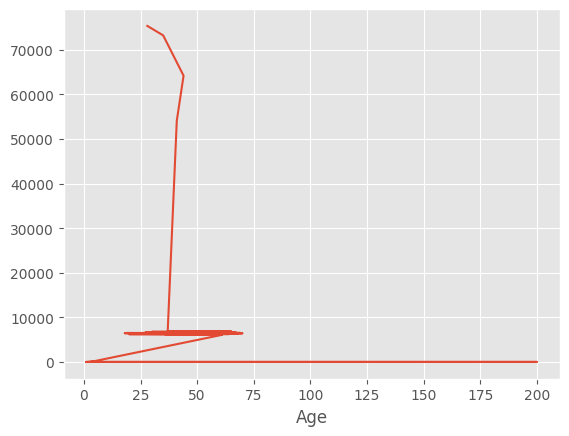

In [40]:
df['Age'].value_counts().plot(kind ='line')

Not the best of graphs:😁. But we see we have a person aged zero and another aged 200. These are erroneous data points.

We will confirm with checking outliers

<Axes: ylabel='Age'>

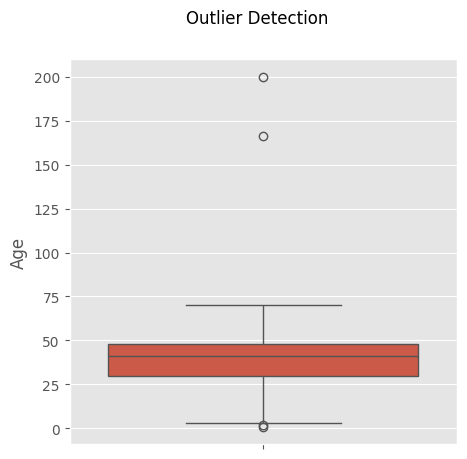

In [41]:

fig, (ax1) = plt.subplots(1,1, figsize=(5,5))
fig.suptitle('Outlier Detection')
sns.boxplot(df['Age'], ax= ax1, orient = 'v')


In [42]:
#median = df.loc[df['Age']<75, 'Age'].median()
#df.loc[df.Age > 75, 'Age'] = np.nan
#df.loc[df.Age <10 ,'Age'] = np.nan
#df.fillna(median,inplace=True)
#df["Age"] = df["Age"].mask(df["Age"] >75, median)
#df["Age"] = df["Age"].mask(df["Age"] <10, median)

<Axes: xlabel='Age'>

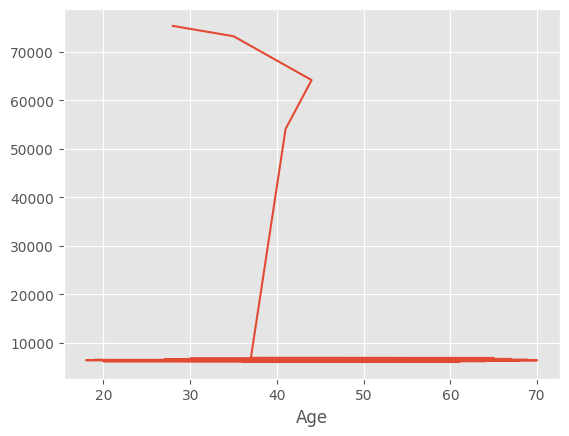

In [43]:
df['Age'].value_counts().plot(kind ='line')

In [44]:
df.dropna(how='all')

,PaymentAmount,PaymentDate,CustomerIdentifier,PaymentMethod,Gender,Race,Province,ProductID,Age
0,107.0,2019-06-23,81246587.0,Debit Order,Female,Black,North West,269424.0,32.0
1,53.0,2019-06-23,82087789.0,Debit Order,Female,Black,Gauteng,685715.0,48.0
2,171.0,2019-06-23,115560640.0,Debit Order,Male,White,Gauteng,523463.0,64.0
3,42.0,2019-06-23,87506111.0,Debit Order,Female,Asian,Free State,420110.0,27.0
4,53.0,2019-06-23,114356637.0,Debit Order,Female,41.0,Gauteng,761379.0,35.0
...,...,...,...,...,...,...,...,...,...
584003,192.0,2019-06-23,78176363.0,Debit Order,Female,Coloured,N/E/W Cape,420110.0,59.0
584004,53.0,2019-06-23,114215516.0,Debit Order,Female,White,Gauteng,32384.0,41.0
584005,213.0,2019-06-23,114228474.0,Cash,Female,White,Gauteng,32384.0,44.0
584006,85.0,2019-06-23,115593555.0,Debit Order,Male,Black,Gauteng,523463.0,55.0


###iii.Visualization and Feature Engineering

In [45]:
paymentscount = len(df.index)

In [46]:
s = df['PaymentDate'].value_counts().sort_index()

<Axes: xlabel='PaymentDate'>

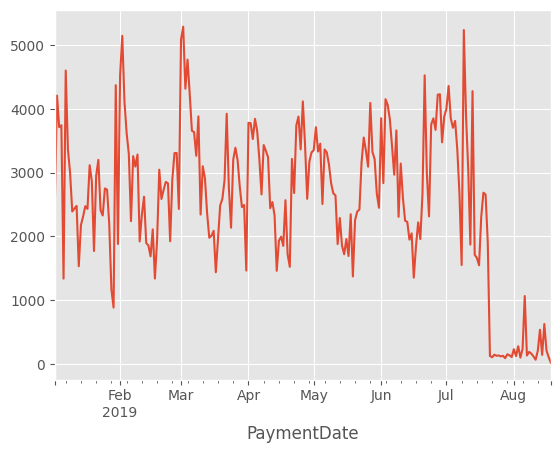

In [47]:
s.plot()

In [48]:
import plotly.graph_objs as go
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.PaymentDate, y=df['PaymentAmount '], marker=dict(color='#32B166')))

fig.update_layout(
    xaxis=dict(
         rangeselector=dict(
             buttons=list([
                 dict(count=1,
                      label="1d",
                      step="day",
                      stepmode="backward"),
                 dict(count=7,
                      label="1w",
                      step="day",
                      stepmode="backward"),
                 dict(count=1,
                      label="1m",
                     step="month",
                      stepmode="backward"),
                 dict(count=3,
                      label="3m",
                      step="month",
                      stepmode="backward"),
                 dict(step="all")
                 ])
                ),
         rangeslider=dict(
             visible=True
        ),
         title='Date'
     ),
     yaxis=dict(
         title='PaymentAmount'
     ),
     xaxis_rangeselector_font_color='black',
     xaxis_rangeselector_activecolor='gray',
     xaxis_rangeselector_bgcolor='#32B166',
     template='ggplot2'
 )
fig.show()

The graph above is not well understood, We will try different aggregations to see what we can make out of the data

Aggregate the Data in months to understand the month view.

In [49]:
by_month = pd.to_datetime(df['PaymentDate']).dt.to_period('M').value_counts().sort_index()
by_month.index = pd.PeriodIndex(by_month.index)
df_month = by_month.rename_axis('month').reset_index(name='counts')
df_month

,month,counts
0,2019-01,79368
1,2019-02,78247
2,2019-03,94135
3,2019-04,88395
4,2019-05,85437
5,2019-06,92313
6,2019-07,61548
7,2019-08,4565


In [50]:
 ! pip install -U kaleido

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 5.8 MB/s eta 0:00:00


In [51]:
fig = go.Figure(data=go.Scatter(x=df_month['month'].astype(dtype=str),
                        y=df_month['counts'],
                        marker_color='indianred', text="counts"))
fig.update_layout({"title": 'Payments Amount per Payment Month',
                   "xaxis": {"title":"Months"},
                   "yaxis": {"title":"Total payments"},
                   "showlegend": False})
fig.show()

In [52]:
df.columns

Index(['PaymentAmount ', 'PaymentDate', 'CustomerIdentifier', 'PaymentMethod',
       'Gender', 'Race', 'Province', 'ProductID', 'Age'],
      dtype='object')

In [53]:
df["PaymentDate"] = pd.to_datetime(df["PaymentDate"])

#Date features
df["Day"] = df["PaymentDate"].dt.dayofweek
df["Month"] = df["PaymentDate"].dt.month
df["Q"] = df["PaymentDate"].dt.quarter
df["Dayofyear"] = df["PaymentDate"].dt.dayofyear
df["Dayofmonth"] = df["PaymentDate"].dt.day
df["Month_day"] = df["PaymentDate"].dt.strftime("%m-%d")
df.index = df["PaymentDate"]
df = df.drop(["PaymentDate"],axis=1)

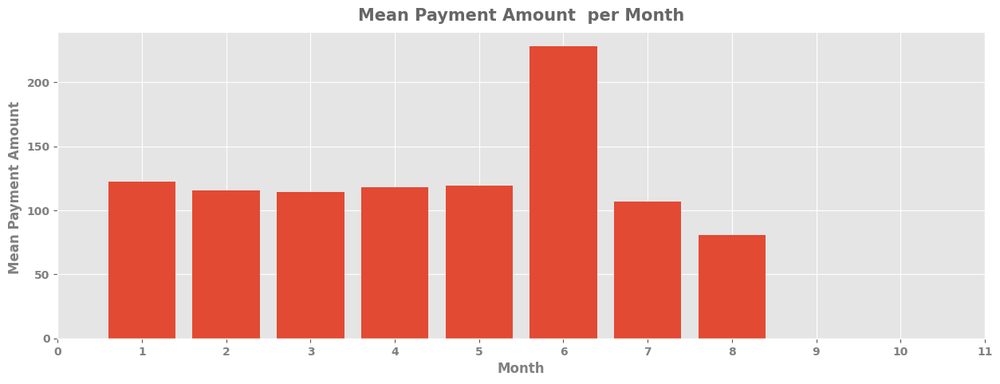

In [54]:
mean_per_Month = df.groupby("Month")["PaymentAmount "].agg(["mean"])

#Plot
fig, ax = plt.subplots(figsize=(15,5))

plt.bar(mean_per_Month.index, mean_per_Month["mean"])

plt.xticks(range(12),alpha=0.75, weight="bold")
plt.yticks(alpha=0.75, weight="bold")

plt.xlabel("Month",alpha=0.75, weight="bold")
plt.ylabel("Mean Payment Amount ",alpha=0.75, weight="bold")

plt.title("Mean Payment Amount  per Month", alpha=0.60, weight="bold", fontsize=15, loc="center", pad=10)

del mean_per_Month

<Axes: xlabel='PaymentMethod'>

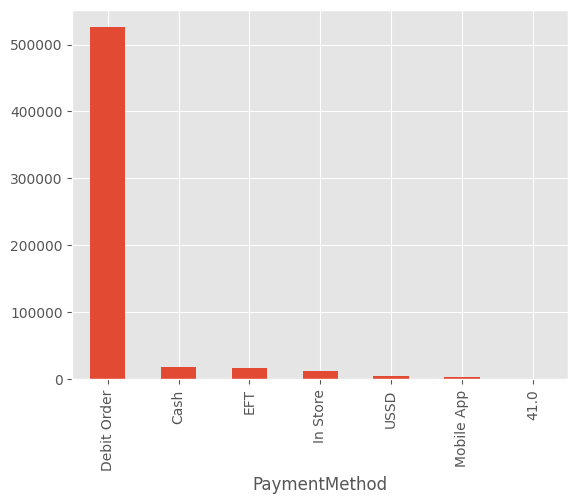

In [55]:
df['PaymentMethod'].value_counts().plot(kind= 'bar')

<Axes: xlabel='Gender'>

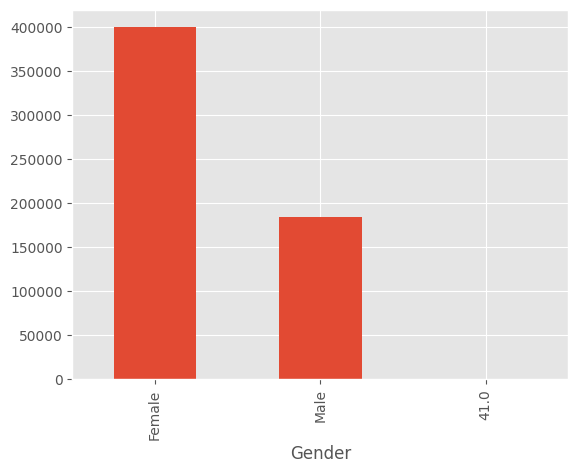

In [56]:
df['Gender'].value_counts().plot(kind= 'bar')

<Axes: xlabel='Race'>

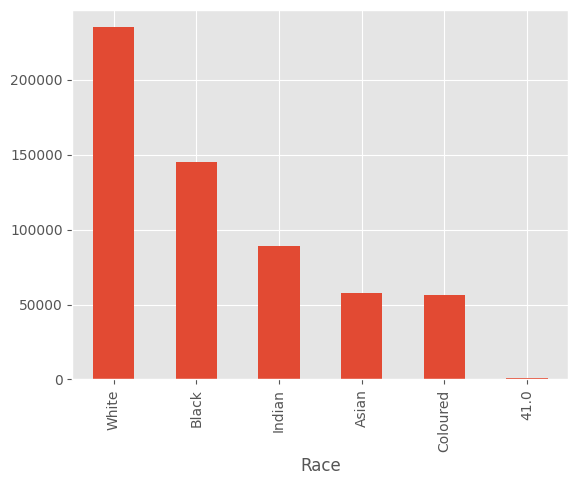

In [57]:
df['Race'].value_counts().plot(kind= 'bar')

<Axes: xlabel='Province'>

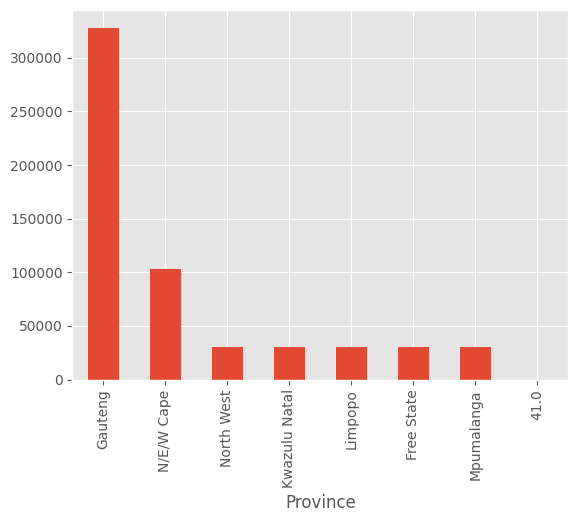

In [58]:
df['Province'].value_counts().plot(kind= 'bar')

In [59]:
df.columns

Index(['PaymentAmount ', 'CustomerIdentifier', 'PaymentMethod', 'Gender',
       'Race', 'Province', 'ProductID', 'Age', 'Day', 'Month', 'Q',
       'Dayofyear', 'Dayofmonth', 'Month_day'],
      dtype='object')

Text(0, 0.5, 'Age')

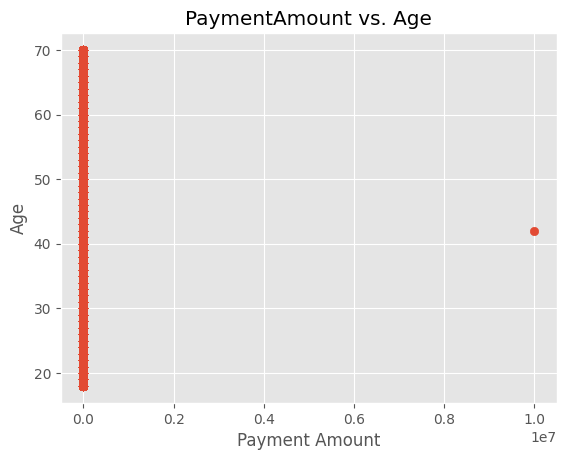

In [60]:
import matplotlib.pyplot as plt

#create scatterplot of hours vs. score
plt.scatter(x = df['PaymentAmount '], y = df['Age'])
plt.title('PaymentAmount vs. Age')
plt.xlabel('Payment Amount')
plt.ylabel('Age')

In [62]:

# Define how the axes of our plots
#plt.figure(figsize=(8, 6))
#sns.barplot(x='Gender', y='Race', data=df, label='Race', color='skyblue')
#sns.barplot(x='Gender', y='Province', data=df, label='Province', color='salmon')
#plt.xlabel('Name')
#plt.ylabel('Count')
#plt.title('Events Breakdown by Name')
#plt.legend()
#plt.show()

Text(0.5, 1.0, 'Mean Payments per Day of the Week')

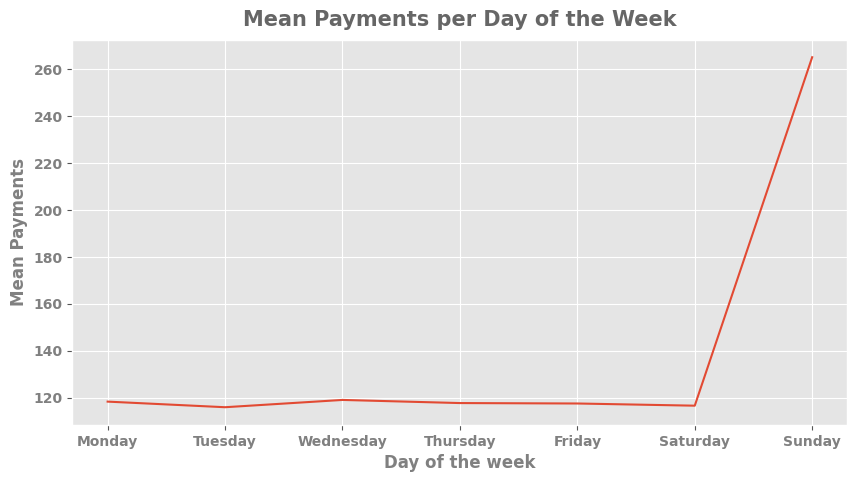

In [63]:

mean_per_day = df.groupby("Day")["PaymentAmount "].agg(["mean"])

#Plot
fig, ax = plt.subplots(figsize=(10,5))


plt.plot(mean_per_day.index,mean_per_day["mean"])

plt.xticks(mean_per_day.index, ["Monday","Tuesday", "Wednesday", "Thursday", "Friday", "Saturday","Sunday"], alpha=0.75, weight="bold")
plt.yticks(alpha=0.75, weight="bold")

plt.xlabel("Day of the week",alpha=0.75, weight="bold")
plt.ylabel("Mean Payments",alpha=0.75, weight="bold")

plt.title("Mean Payments per Day of the Week", alpha=0.60, weight="bold", fontsize=15, loc="center", pad=10)

Sunday stands out as the day people mostly pay fot Cable.

We could also add South Africa holidays and see how they affect the data.

South Africa Holidays inour data scope January 01to August 31

Link to holidays is [here](https://www.calendarlabs.com/holidays/south-africa/2019)

*   January 01 - New Years
*   March 21 - Human Rights
*   April 19 - Good Friday
*   April 21 - Easter
*   April 22 - Family Day
*   April 27 -  Freedom Day
*   May 01 - Workers Day
*   May 25  - Africa Day
*  June 16 - Youth Day
*  June 17 - Youth Day Holidays
* August 09 - Womens Day








In [64]:
def feature_holidays(row):

    if row["Month_day"] == "01-01":
        return "New Year"
    if row["Month_day"] == "03-21":
        return "Human Rights"
    if row["Month_day"] == "04-19":
        return "Good Friday"
    if row["Month_day"] == "04-21":
        return "Easter"
    if row["Month_day"] == "04-22":
        return "Family Day"
    if row["Month_day"] == "04-27":
        return "Freedom Day"
    if row["Month_day"] == "05-01":
        return "Workers Day"
    if row["Month_day"] == "05-25":
        return "Africa Day"
    if row["Month_day"] == "06-16":
        return "Youth Day"
    if row["Month_day"] == "06-17":
        return "Youth Day Holidays"
    if row["Month_day"] == "08-09":
        return "Womens Day"
    return    'Other'

In [65]:
# Add the holidays to the dataframe
df["Holiday"] = df.apply (lambda row : feature_holidays(row), axis=1)

In [66]:
 # Creating times grouped dataframes in order to analyse them
df_month = df.groupby('Month', sort = False)['PaymentAmount '].sum()
df_quarter = df.groupby('Q')['PaymentAmount '].sum()
df_day =df.groupby('Day', sort = False)['PaymentAmount '].sum()
df_day_of_year = df.groupby('Dayofyear')['PaymentAmount '].sum()
df_day_of_month = df.groupby('Dayofmonth')['PaymentAmount '].sum()


In [67]:
df.head(1)

,PaymentAmount,CustomerIdentifier,PaymentMethod,Gender,Race,Province,ProductID,Age,Day,Month,Q,Dayofyear,Dayofmonth,Month_day,Holiday
PaymentDate,,,,,,,,,,,,,,,
2019-06-23,107.0,81246587.0,Debit Order,Female,Black,North West,269424.0,32.0,6,6,2,174,23,06-23,Other


In [68]:
#df.drop(["Month_day"],axis=0)
df.head()

,PaymentAmount,CustomerIdentifier,PaymentMethod,Gender,Race,Province,ProductID,Age,Day,Month,Q,Dayofyear,Dayofmonth,Month_day,Holiday
PaymentDate,,,,,,,,,,,,,,,
2019-06-23,107.0,81246587.0,Debit Order,Female,Black,North West,269424.0,32.0,6,6,2,174,23,06-23,Other
2019-06-23,53.0,82087789.0,Debit Order,Female,Black,Gauteng,685715.0,48.0,6,6,2,174,23,06-23,Other
2019-06-23,171.0,115560640.0,Debit Order,Male,White,Gauteng,523463.0,64.0,6,6,2,174,23,06-23,Other
2019-06-23,42.0,87506111.0,Debit Order,Female,Asian,Free State,420110.0,27.0,6,6,2,174,23,06-23,Other
2019-06-23,53.0,114356637.0,Debit Order,Female,41.0,Gauteng,761379.0,35.0,6,6,2,174,23,06-23,Other


In [69]:
df.drop('Month_day',
  axis='columns', inplace=True)

In [70]:

# Get Dummies.
#
cat = ['object']
cat = df.select_dtypes(include=cat)
cat.columns

Index(['PaymentMethod', 'Gender', 'Race', 'Province', 'Holiday'], dtype='object')

In [71]:
df.columns

Index(['PaymentAmount ', 'CustomerIdentifier', 'PaymentMethod', 'Gender',
       'Race', 'Province', 'ProductID', 'Age', 'Day', 'Month', 'Q',
       'Dayofyear', 'Dayofmonth', 'Holiday'],
      dtype='object')

In [72]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
PaymentAmount,584008.0,1.336813e+02,1.308552e+04,27.0,85.0,101.0,171.0,10000000.0
CustomerIdentifier,584008.0,9.916975e+07,1.480515e+07,-9.0,84122680.0,104228569.0,114436868.0,115656267.0
ProductID,584008.0,4.061534e+05,2.414378e+05,41.0,269424.0,523463.0,523463.0,844702.0
Age,584008.0,4.089276e+01,1.295363e+01,18.0,30.0,41.0,48.0,70.0
Day,584008.0,2.920010e+00,1.942588e+00,0.0,1.0,3.0,5.0,6.0
Month,584008.0,3.973004e+00,1.942074e+00,1.0,2.0,4.0,6.0,8.0
Q,584008.0,1.682133e+00,6.657625e-01,1.0,1.0,2.0,2.0,3.0
Dayofyear,584008.0,1.038324e+02,5.866593e+01,2.0,56.0,103.0,155.0,230.0
Dayofmonth,584008.0,1.439035e+01,9.111259e+00,1.0,6.0,13.0,23.0,31.0


In [73]:
# First we are going to covert our categorical data  to numerical data so that we can be able to create a correlation matrix.
# Convert catergorical data to Numerical
 # Index(['PaymentMethod', 'Gender', 'Race', 'Province', 'Holiday'], dtype='object')
from sklearn.preprocessing import LabelEncoder
en = LabelEncoder()
df['PaymentMethod'] = en.fit_transform(df['PaymentMethod'])
df['Gender'] = en.fit_transform(df['Gender'])
df['Race'] = en.fit_transform(df['Race'])
df['Province'] = en.fit_transform(df['Province'])
df['Holiday'] = en.fit_transform(df['Holiday'])

TypeError: Encoders require their input to be uniformly strings or numbers. Got ['float64', 'str']